# 1 - Introduction

**Phase 2 - Graded Challenge 7**

**Name**: Verren Monica

**Batch**: RMT-038

**Data Source Link**: [Car vs Bike Classification Dataset](https://www.kaggle.com/datasets/utkarshsaxenadn/car-vs-bike-classification-dataset/data)

**Background**:

Lalu lintas yang padat dan tidak teratur menjadi salah satu tantangan utama di banyak kota terutama negara berkembang. Meningkatnya jumlah kendaraan baik motor dan mobil di jalan raya mengakibatkan munculnya kebutuhan mendesak untuk mengelola arus lalu lintas dan infrastruktur jalan sehingga dapat lebih efisien. Kurangnya data akurat mengenai jumlah dan jenis kendaraan yang melintas di suatu area sering menjadi penghambat dalam pengambilan keputusan yang tepat terkait kebijakan transportasi dan pengembangan infrastruktur.

Oleh karena itu, saya akan mengembangkan sebuah model computer vision yang dapat membedakan antara mobil dan sepeda motor. Model ini dilatih menggunakan dataset kendaraan (mobil dan sepeda motor) dan dirancang untuk mengenali serta mengklasifikasikan jenis kendaraan secara akurat. Dengan adanya model ini, diharapkan dapat membantu proses perhitungan jumlah kendaraan yang melintas di jalan, sehingga mendukung berbagai kebutuhan, seperti:

- Menyediakan data statistik kendaraan yang melintas untuk analisis lalu lintas.
- Membantu sistem pemantauan atau pengawasan lalu lintas secara otomatis.
- Meningkatkan efisiensi dalam manajemen lalu lintas dan perencanaan kota.

Model ini akan dievaluasi menggunakan metriks akurasi, untuk menilai sejauh mana model dapat memprediksi jenis kendaraan dengan tepat. Proses pelatihan akan dilakukan dengan menggunakan data yang beragam agar model dapat generalisasi dengan baik dalam berbagai kondisi nyata.

**Objectives**:

Membuat model computer vision untuk mendeteksi bentuk mobil dan sepeda motor untuk mendukung pengaturan lalu lintas dan perencanaan infrastruktur kota secara lebih efektif. Model computer vision ini  dilatih dengan augmentasi data untuk meningkatkan keragaman dataset dan menggunakan arsitektur Convolutional Neural Network (CNN) berjenis sequential. Model akan dievaluasi menggunakan metrik akurasi dan diimprovisasi lebih lanjut untuk meningkatkan kinerja deteksi serta klasifikasi kendaraan. Model ini akan membantu pemerintah kota dan lembaga transportasi, pengelola jalan, perencana kota.

# 2 - Import Libraries

In [1]:
# Downgrade version of TensorFlow and tf-keras
!pip install -q --upgrade "tensorflow<2.16" "tf-keras<2.16"

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 59.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 27.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 61.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 72.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 30.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 7.6 MB/s eta 0:00:00


In [2]:
# Import libraries
import os
import glob
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import shutil
from PIL import Image
from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Dense, Dropout, Conv2D, MaxPooling2D, Flatten

from sklearn.metrics import classification_report
import warnings
warnings.filterwarnings('ignore')

# Check TensorFlow version
print(tf.__version__)

2.15.1


# 3 - Data Loading

Dataset yang digunakan akan diambil dari kaggle pada link yang tercantum di bagian introduction.

In [3]:
# Download dataset
%%time
!kaggle datasets download -d utkarshsaxenadn/car-vs-bike-classification-dataset

Dataset URL: https://www.kaggle.com/datasets/utkarshsaxenadn/car-vs-bike-classification-dataset
License(s): CC0-1.0
 98% 101M/103M [00:03<00:00, 39.1MB/s] 
100% 103M/103M [00:03<00:00, 33.4MB/s]
CPU times: user 53.6 ms, sys: 7.19 ms, total: 60.8 ms
Wall time: 5.06 s


In [4]:
# This code will delete the dataset folder, which helps to start fresh
# Only use this if needed, such as after changing the dataset or wanting to reset the session
# Deleting the dataset folder
# shutil.rmtree('/content/Car-Bike-Dataset')
# If you are connecting to a new runtime, you don’t need to run this code unless you want to restart everything
# After running this code, you can rerun all cells to reload the data and model

# Unzip datasets
!unzip -qq ./car-vs-bike-classification-dataset.zip

In [5]:
# Renaming filenames on each category
bikeFiles = glob.glob('/content/Car-Bike-Dataset/Bike/*')
num = 1
for bf in bikeFiles:
  extension = os.path.splitext(bf)[1]
  os.rename(bf, '/content/Car-Bike-Dataset/Bike/bike_' + "{:05d}".format(num) + f'{extension}')
  num += 1

carFiles = glob.glob('/content/Car-Bike-Dataset/Car/*')
num = 1
for cf in carFiles:
  extension = os.path.splitext(cf)[1]
  os.rename(cf, '/content/Car-Bike-Dataset/Car/car_' + "{:05d}".format(num) + f'{extension}')
  num += 1

In [6]:
# Check each file
newBikes =  glob.glob('/content/Car-Bike-Dataset/Bike/*')
newBikes.sort()
print('Bike File:', newBikes)
print(len(newBikes))
print("")
newCars =  glob.glob('/content/Car-Bike-Dataset/Car/*')
newCars.sort()
print('Car File:', newCars)
print(len(newCars))

Bike File: ['/content/Car-Bike-Dataset/Bike/bike_00001.jpeg', '/content/Car-Bike-Dataset/Bike/bike_00002.jpeg', '/content/Car-Bike-Dataset/Bike/bike_00003.jpeg', '/content/Car-Bike-Dataset/Bike/bike_00004.jpg', '/content/Car-Bike-Dataset/Bike/bike_00005.jpeg', '/content/Car-Bike-Dataset/Bike/bike_00006.jpeg', '/content/Car-Bike-Dataset/Bike/bike_00007.jpeg', '/content/Car-Bike-Dataset/Bike/bike_00008.jpeg', '/content/Car-Bike-Dataset/Bike/bike_00009.jpg', '/content/Car-Bike-Dataset/Bike/bike_00010.jpg', '/content/Car-Bike-Dataset/Bike/bike_00011.jpeg', '/content/Car-Bike-Dataset/Bike/bike_00012.jpeg', '/content/Car-Bike-Dataset/Bike/bike_00013.jpg', '/content/Car-Bike-Dataset/Bike/bike_00014.jpeg', '/content/Car-Bike-Dataset/Bike/bike_00015.jpeg', '/content/Car-Bike-Dataset/Bike/bike_00016.jpeg', '/content/Car-Bike-Dataset/Bike/bike_00017.jpeg', '/content/Car-Bike-Dataset/Bike/bike_00018.jpeg', '/content/Car-Bike-Dataset/Bike/bike_00019.jpeg', '/content/Car-Bike-Dataset/Bike/bike_00020

Berdasarkan pemeriksaan di atas, ditemukan bahwa folder Bike berisi 2.000 gambar dan folder Car berisi 2.000 gambar. Dengan demikian, total jumlah gambar adalah 4.000. Dataset ini cukup seimbang, sehingga metriks akurasi cocok untuk digunakan.

In [7]:
# Function to visualize the first 5 images from each class
def plotImages(path):
  labels = sorted(os.listdir(path))
  for label in labels:
    folder_path = os.path.join(path, label)
    fig = plt.figure(figsize=(20, 20))
    columns = 5
    rows = 1
    print('Class : ', label)
    images = sorted(os.listdir(folder_path))
    for index in range(1, columns*rows +1):
        fig.add_subplot(rows, columns, index)
        image = plt.imread(os.path.join(folder_path, images[index]))
        plt.imshow(image)
        plt.axis("off")
    plt.show()

In [8]:
# Define path
mainPath = '/content/Car-Bike-Dataset/'
bikesPath = os.path.join(mainPath,'Bike')
carsPath = os.path.join(mainPath,'Car')

Class :  Bike


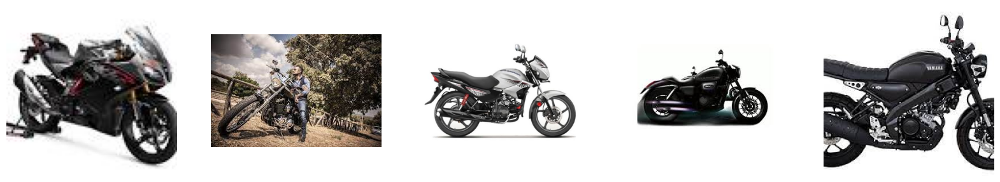

Class :  Car


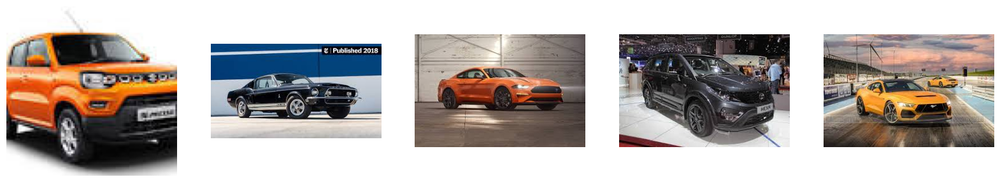

In [9]:
# Plot images
plotImages(mainPath)

# 4 - Exploratory Data Analysis

Pada bagian ini akan dilakukan eksplorasi dataset yang dimiliki. Analisa yang dilakukan meliputi karakteristik masing-masing kategori mulai dari bentuk, warna, ruang warna, angle dan karakteristik lainnya. Saya akan menampilkan
75 gambar dari kategori Bike dan 75 gambar dari kategori Car untuk membantu menganalisa karakteristik masing-masing kategori.

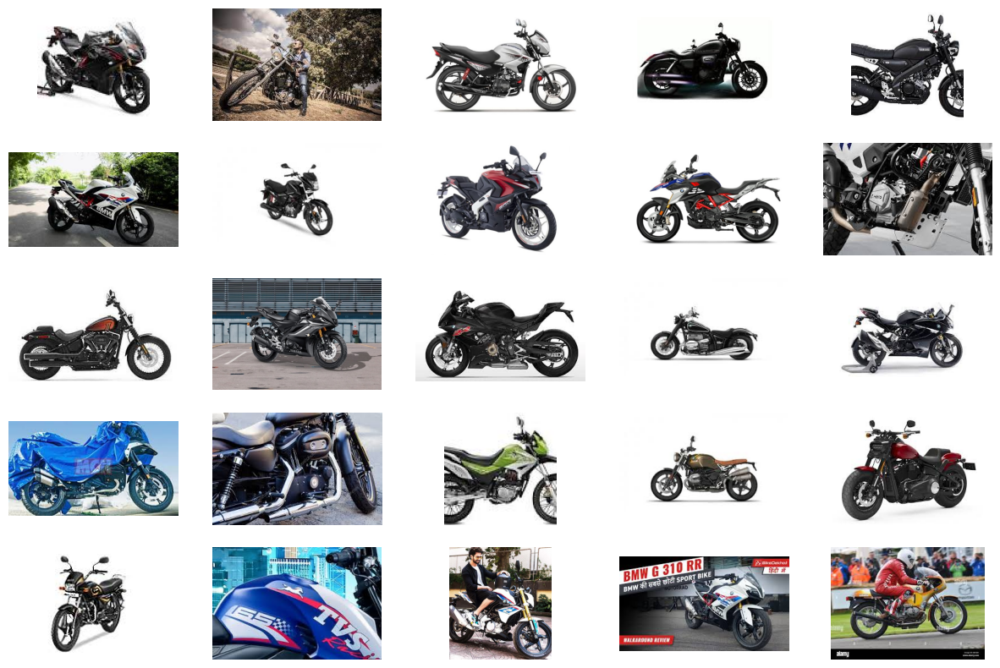

In [10]:
# Display first 25 bikes
fig = plt.figure(figsize=(15, 10))
columns = 5
rows = 5
images = sorted(os.listdir(bikesPath))
for index in range(1, columns*rows +1):
    fig.add_subplot(rows, columns, index)
    image = plt.imread(os.path.join(bikesPath, images[index]))
    plt.imshow(image)
    plt.axis("off")
plt.show()

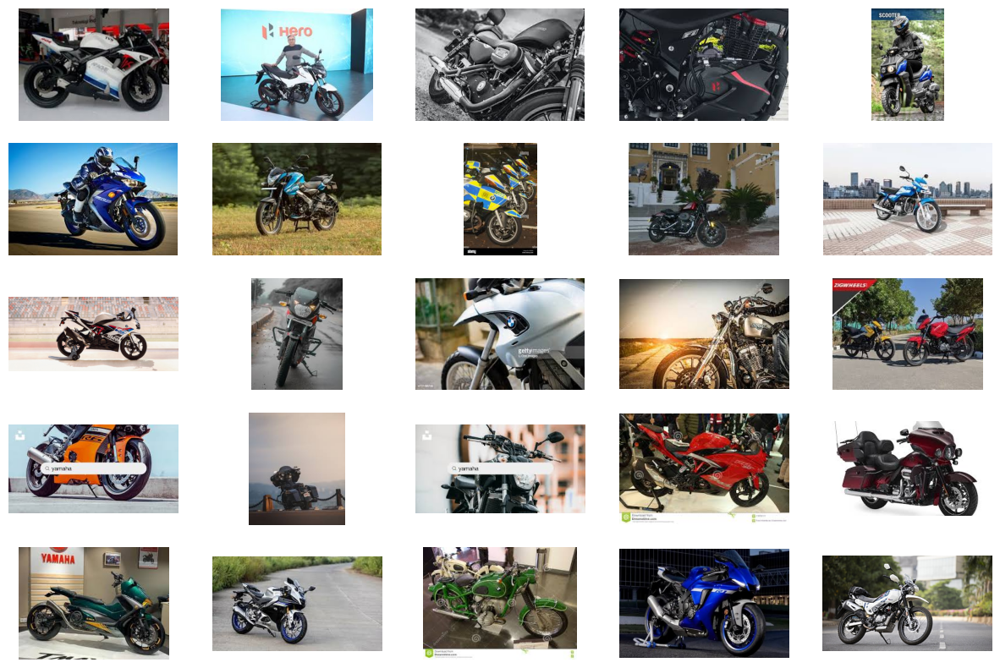

In [11]:
# Display bikes in index 1000 to 1025
fig = plt.figure(figsize=(15, 10))
columns = 5
rows = 5
startIndex = 1000
images = sorted(os.listdir(bikesPath))
for index in range(1, columns * rows+1):
    fig.add_subplot(rows, columns, index)
    image = plt.imread(os.path.join(bikesPath, images[startIndex+index]))
    plt.imshow(image)
    plt.axis("off")
plt.show()

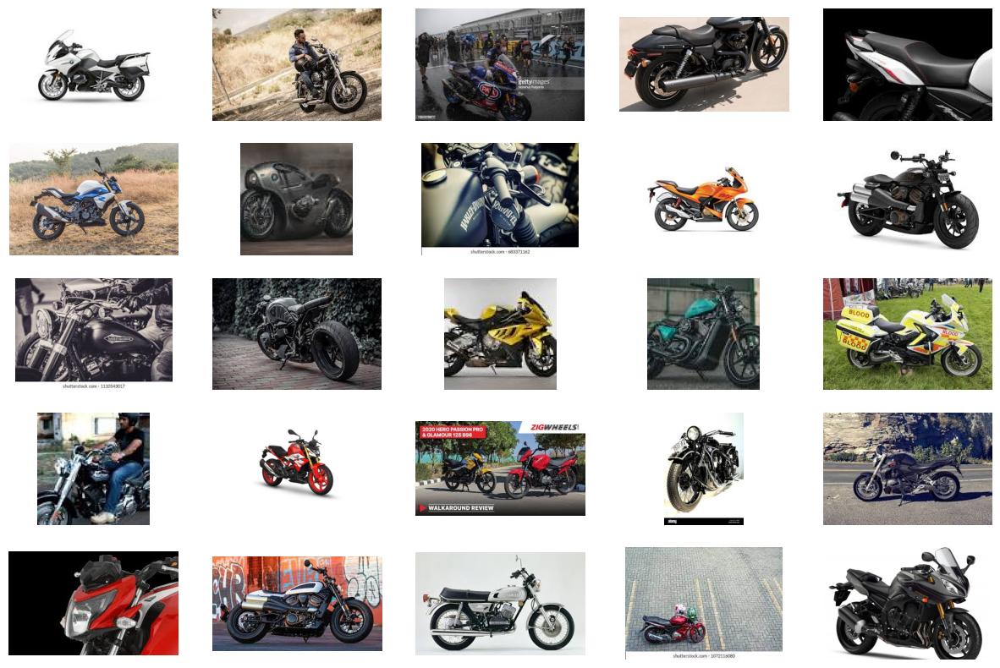

In [12]:
# Display bikes in index 1500 to 1525
fig = plt.figure(figsize=(15, 10))
columns = 5
rows = 5
startIndex = 1500
images = sorted(os.listdir(bikesPath))
for index in range(1, columns * rows+1):
    fig.add_subplot(rows, columns, index)
    image = plt.imread(os.path.join(bikesPath, images[startIndex+index]))
    plt.imshow(image)
    plt.axis("off")
plt.show()

Berdasarkan sumber yang saya baca ([Mengenal 8 Jenis Sepeda Motor](https://www.inews.id/otomotif/motor/mengenal-8-jenis-sepeda-motor-dari-model-skuter-hingga-touring/2)), ada 8 jenis sepeda motor yaitu:
1. Motor bebek (cub)
2. Skuter
3. Dual-Sport
4. Naked Bike
5. Sport Bike
6. Retro
7. Cruiser
8. Touring

Jika dilihat dari 75 gambar dalam kategori bike yang ditampilkan diatas, ditemukan bahwa gambar sepeda motor dalam dataset di dominasi oleh tipe Dual-Sport, Naked Bike, Sport Bike, Retro, Cruiser dan Touring. Tidak ada gambar sepeda motor yang ditampilkan yang masuk ke dalam tipe Motor Bebek dan Skuter. Model kemungkinan akan belajar lebih banyak gambar mengenai bentuk sepeda motor selain Motor Bebek dan Skuter.

Dari segi warna, banyak sepeda motor dalam gambar yang dominan dengan warna hitam, putih, merah, biru. Ditemukan pula bahwa dalam sebuah motor dapat mengandung 2 warna seperti merah dan hitam, biru dan hitam atau putih dan hitam.

Selain itu, sudut pengambilan gambar dalam kategori bike cukup variatif, ada yang memperlihatkan tampak depan, tampak samping (kanan dan kiri), tampak depan dan samping serta tampak belakang sepeda motor. Hal ini memungkinkan model untuk belajar bentuk sepeda motor dari beberapa angle. Namun, ada beberapa gambar yang tampak terlalu jauh dari kamera pengambilan gambar hal ini dapat membuat model kesulitan untuk mengenali gambar sepeda motor.

Dari beberapa gambar dalam kategori bike yang ditampilkan ditemukan beberapa karakeristik lainnya seperti:
- Beberapa gambar hanya menampilkan sebagian bagian dari sepeda motor seperti di bagian depan motor, bagian belakang motor dan tampak depan motor.
- Beberapa gambar dalam dataset ada yang tidak memiliki background (hanya warna putih), ada yang dengan background jalan, pemandangan rumput yang luas, suasana arena balapan, halaman rumah dan bahkan dengan background suasana di dalam gedung seperti pameran.
- Beberapa gambar sepeda motor ada yang diambil saat sedang dikendarai oleh manusia, diambil dengan foto seorang model dan ada yang hanya gambar sepeda motor tanpa gambar manusia.
- Beberapa gambar sepertinya ada yang diambil dengan tujuan komersial dan ada yang memang hanya diambil untuk kebutuhan dokumentasi.
- Bebreapa gambar memiliki lebih dari 1 sepeda motor di dalamnya.

Hal ini memungkinkan model belajar mengenali bentuk sepeda motor dengan berbagai macam background dan kondisi. Namun juga dapat membuat model kesulitan mengenali gambar jika hanya bagian tertentu saja yang ada pada gambar.

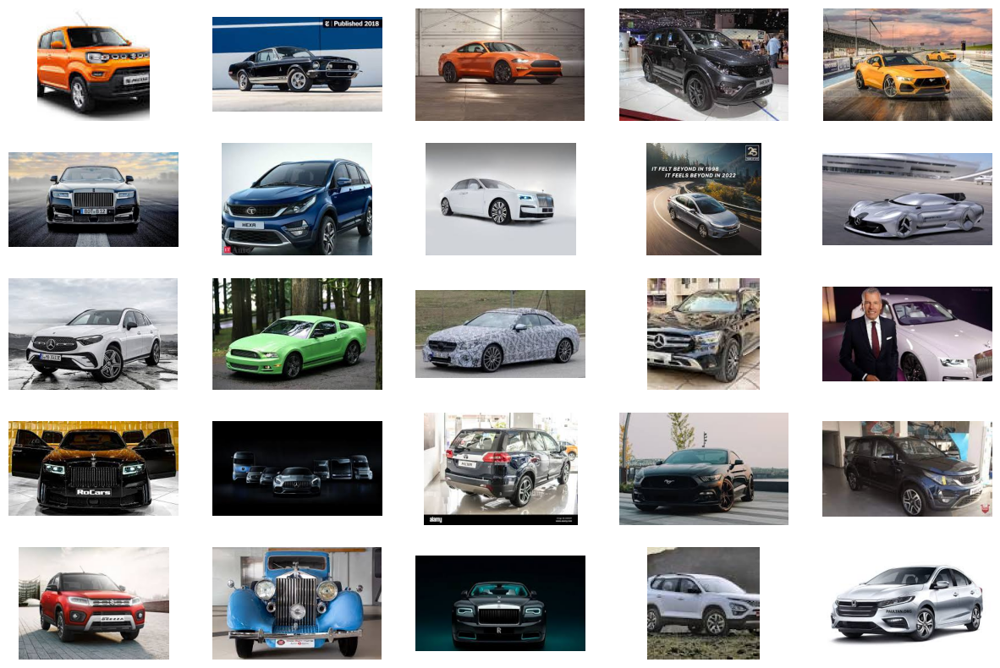

In [13]:
# Display cars in index 1 to 25
fig = plt.figure(figsize=(15, 10))
columns = 5
rows = 5
images = sorted(os.listdir(carsPath))
for index in range(1, columns*rows +1):
    fig.add_subplot(rows, columns, index)
    image = plt.imread(os.path.join(carsPath, images[index]))
    plt.imshow(image)
    plt.axis("off")
plt.show()

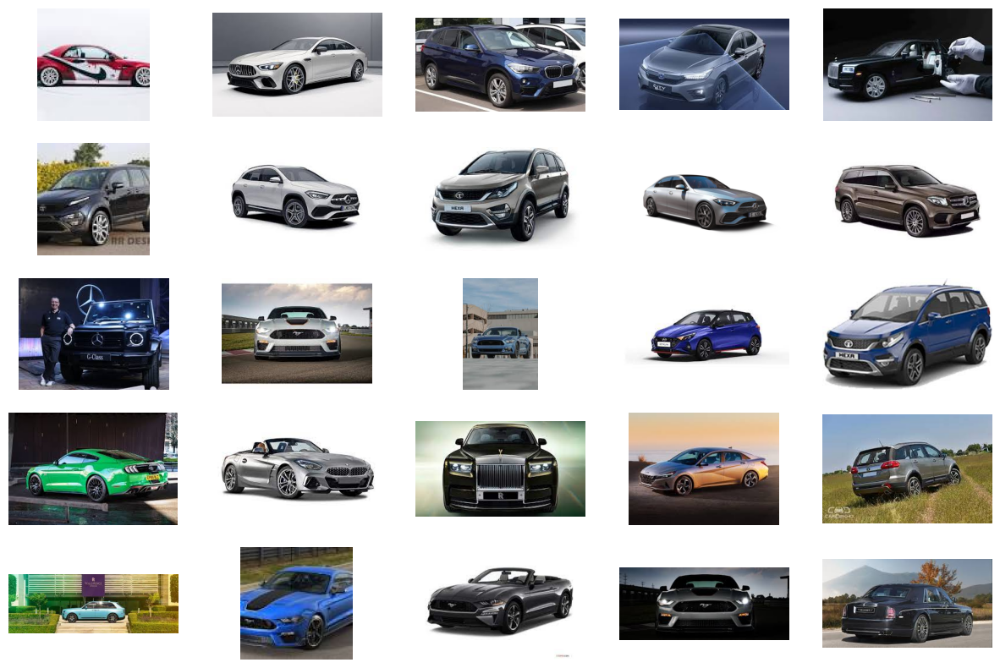

In [14]:
# Display cars in index 900 to 925
fig = plt.figure(figsize=(15, 10))
columns = 5
rows = 5
images = sorted(os.listdir(carsPath))
startIndex = 900
for index in range(1, columns*rows +1):
    fig.add_subplot(rows, columns, index)
    image = plt.imread(os.path.join(carsPath, images[startIndex+index]))
    plt.imshow(image)
    plt.axis("off")
plt.show()

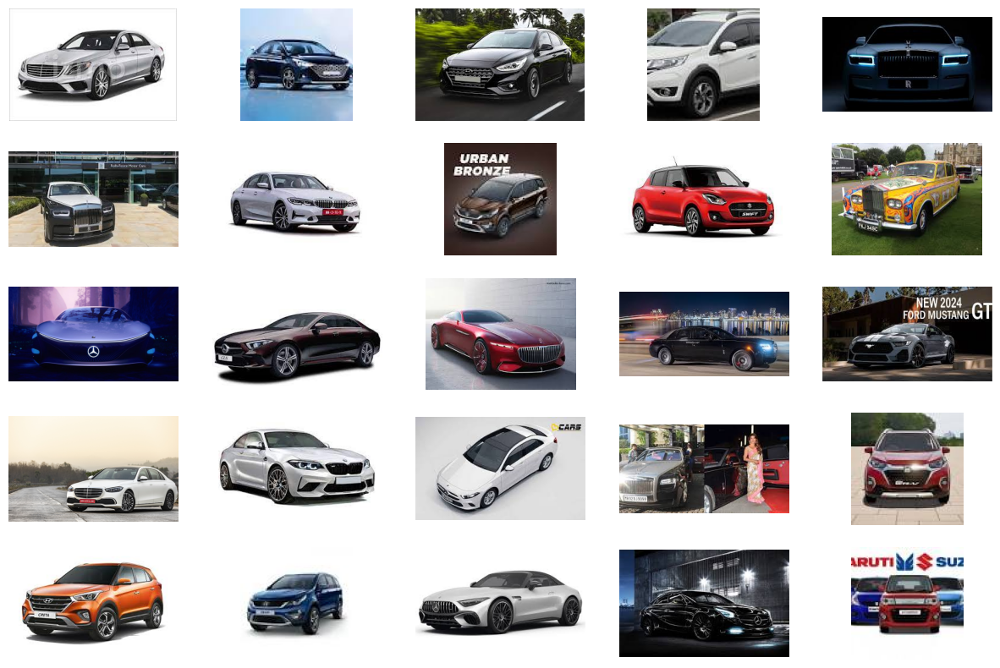

In [15]:
# Display cars in index 1500 to 1525
fig = plt.figure(figsize=(15, 10))
columns = 5
rows = 5
images = sorted(os.listdir(carsPath))
startIndex = 1500
for index in range(1, columns*rows +1):
    fig.add_subplot(rows, columns, index)
    image = plt.imread(os.path.join(carsPath, images[startIndex+index]))
    plt.imshow(image)
    plt.axis("off")
plt.show()

Berdasarkan sumber yang saya baca ([Car Types](https://www.caranddriver.com/shopping-advice/g26100588/car-types/)), terdapat beberapa tipe mobil diantaranya adalah:
1. Sedan
2. Coupe
3. Sports Car
4. Station Wagon
5. Hatchback
6. Convertible
7. Sport-utility Vehicle (SUV)
8. Minivan
9. Pickup Truck

Jika dilihat dari 75 gambar dalam kategori car, ditemukan bahwa gambar mobil dalam dataset cukup mewakili tipe-tipe mobil yang disebutkan, kecuali tipe mobil pickup truck. Sehingga, model akan banyak belajar mengenai bentuk mobil dari tipe yang bermacam-macam, namun ketiadaan tipe mobil pickup truck mungkin akan membuat model kesulitan dalam mengenali object.

Dari segi warna, gambar mobil yang ada di dominasi dengan warna merah, putih, hitam, biru dan orange. Jarang sekali di temukan sebuah gambar mobil dengan kombinasi 2 warna (tidak seperti dalam gambar sepeda motor).

Selain itu, dari segi sudut pengambilan gambar sudah cukup variatif, ada mobil-mobil dengan tampak depan, tampak samping (kanan dan kiri), tampak belakang, tampak depan dan samping, dan tampak atas. Hal ini memungkinkan model untuk belajar mengenal object model dari berbagai macam sisi (angle). Namun, ada juga mobil yang jauh dari kamera pengambilan gambar yang mungkin akan menyebabkan model sulit mengenali bentuknya.

Dari beberapa gambar dalam kateori car yang ditampilkan ditemukan beberapa karakeristik lainnya seperti:
- Beberapa gambar tidak memiliki background (hanya warna putih atau hitam saja), ada yang dengan background jalan, gedung, pemandangan, dan di dalam gedung dengan suasana pameran.
- Beberapa gambar diambil terlihat seperti sedang bergerak dan ada juga yang diambil pada saat ada manusia di dekat mobil.
- Beberapa gambar diambil sepertinya diambil untuk tujuan komersial dan ada pula yang diambil untuk dokumentasi.

Hal ini mendukung model untuk mempelajari bentuk mobil dengan berbagai macam background.

Secara keseluruhan, perbedaan yang dominan antara kategori bike dan car dalam dataset adalah bentuk objek. Objek dalam dataset car memiliki dimensi yang lebih besar dibandingkan dengan objek dalam dataset bike. Hal ini bisa mempengaruhi cara model computer vision mendeteksi dan mengenali objek, karena objek dengan dimensi yang lebih besar akan memiliki representasi visual yang berbeda, seperti ukuran pixel yang lebih besar dalam gambar.

Selanjutnya, saya akan melakukan analisa ruang warna (color modes) pada dataset car and bike. Analisa ini dilakukan dengan tujuan menstandarkan input gambar ke model agar data gambar yang nantinya digunakan oleh model sehingga memiliki format yang konsisten dan mencegah terjadinya error.

In [16]:
# Function to check color modes
def listColorMode(filePath):
    colorModesList = []
    for file in filePath:
        with Image.open(file) as img:
            colorModesList.append(img.mode)
    return colorModesList

# Check color modes for every image in each category
bikeModeList = listColorMode(glob.glob('/content/Car-Bike-Dataset/Bike/*'))
carModeList = listColorMode(glob.glob('/content/Car-Bike-Dataset/Car/*'))

print("Unique color modes in Bike folder:", set(bikeModeList))
print("Unique color modes in Car folder:", set(carModeList))

Unique color modes in Bike folder: {'RGB', 'RGBA', 'P'}
Unique color modes in Car folder: {'RGB', 'RGBA', 'P'}


Dari informasi diatas, ditemukan bahwa dari dataset images bike and car terdapat 3 color modes pada masing-masing kategori yaitu P, RGB dan RGBA.
Berdasarkan studi yang saya lakukan, berikut adalah pengertian dari masing-masing color modes pada dataset:

- P: 1 layer warna dengan 8-bit pixels.
- RGB: 3 layer warna dengan 8-bit pixels, warna dasar yaitu merah, biru dan hijau.
- RGBA: 4 layer warna dengan 8-bit pixels, warna dasar yaitu merah, biru dan hijau dengan 1 layer transparan(alpha).

Selanjutnya saya akan melakukan analisis jumlah color modes pada masing-masing kategori.

In [17]:
# Create data frame bike images with color modes for each image
bikesDF = pd.DataFrame({'images':newBikes, 'label':'bikes', 'colorModes':bikeModeList})
bikesDF.head(10)

,images,label,colorModes
0,/content/Car-Bike-Dataset/Bike/bike_00001.jpeg,bikes,RGB
1,/content/Car-Bike-Dataset/Bike/bike_00002.jpeg,bikes,RGB
2,/content/Car-Bike-Dataset/Bike/bike_00003.jpeg,bikes,RGB
3,/content/Car-Bike-Dataset/Bike/bike_00004.jpg,bikes,RGB
4,/content/Car-Bike-Dataset/Bike/bike_00005.jpeg,bikes,RGB
5,/content/Car-Bike-Dataset/Bike/bike_00006.jpeg,bikes,RGB
6,/content/Car-Bike-Dataset/Bike/bike_00007.jpeg,bikes,RGB
7,/content/Car-Bike-Dataset/Bike/bike_00008.jpeg,bikes,RGB
8,/content/Car-Bike-Dataset/Bike/bike_00009.jpg,bikes,RGB
9,/content/Car-Bike-Dataset/Bike/bike_00010.jpg,bikes,RGB


In [18]:
# Count the number of each color modes in bikes file
cmCount = bikesDF['colorModes'].value_counts().reset_index()
cmCount

,colorModes,count
0,RGB,1982
1,RGBA,14
2,P,4


Dari dataset bike, ditemukan 1982 gambar dengan color modes RGB, 14 gambar dengan color modes RGBA dan 4 gambar dengan color modes P.

In [19]:
# Create data frame car images with color modes for each image
carsDF = pd.DataFrame({'images':newCars, 'label': 'cars', 'colorModes':carModeList})
carsDF.head(10)

,images,label,colorModes
0,/content/Car-Bike-Dataset/Car/car_00001.jpeg,cars,RGB
1,/content/Car-Bike-Dataset/Car/car_00002.jpeg,cars,RGB
2,/content/Car-Bike-Dataset/Car/car_00003.jpeg,cars,RGB
3,/content/Car-Bike-Dataset/Car/car_00004.jpeg,cars,RGB
4,/content/Car-Bike-Dataset/Car/car_00005.jpeg,cars,RGB
5,/content/Car-Bike-Dataset/Car/car_00006.jpeg,cars,RGB
6,/content/Car-Bike-Dataset/Car/car_00007.jpeg,cars,RGB
7,/content/Car-Bike-Dataset/Car/car_00008.jpeg,cars,RGB
8,/content/Car-Bike-Dataset/Car/car_00009.jpeg,cars,RGB
9,/content/Car-Bike-Dataset/Car/car_00010.jpeg,cars,RGB


In [20]:
# Count the number of each color modes in car files
cmCount2 = carsDF['colorModes'].value_counts().reset_index()
cmCount2

,colorModes,count
0,RGB,1995
1,P,3
2,RGBA,2


Dari dataset car, ditemukan 1995 gambar dengan color modes RGB, 3 gambar dengan color modes P, dan 2 gambar dengan color modes RGBA.

Sehingga jika data bike and car digabungkan akan menjadi sebagai berikut:

In [21]:
# Concat bikes and cars df
df = pd.concat([bikesDF, carsDF]).reset_index(drop=True)
df = df.sample(len(df), random_state = 26).reset_index(drop=True)
df.head(5)

,images,label,colorModes
0,/content/Car-Bike-Dataset/Car/car_01022.jpeg,cars,RGB
1,/content/Car-Bike-Dataset/Car/car_00015.jpeg,cars,RGB
2,/content/Car-Bike-Dataset/Car/car_01542.jpeg,cars,RGB
3,/content/Car-Bike-Dataset/Bike/bike_00834.jpeg,bikes,RGB
4,/content/Car-Bike-Dataset/Car/car_00017.jpeg,cars,RGB


In [22]:
# Count the number of color modes in df
cmCount3 = df['colorModes'].value_counts().reset_index()
cmCount3

,colorModes,count
0,RGB,3977
1,RGBA,16
2,P,7


Dari perhitungan diatas, diperoleh informasi bahwa ditemukan total 16 gambar dengan color modes RGBA atau 0.4% dari total data dan ditemukan 7 gambar dengan color modes P atau 0.175% dari total data. Sehingga 99.425% memiliki color modes RGB.

Berdasarkan studi literatur yang saya lakukan, salah satu jurnal mengenai Color Spaces menyatakan bahwa hasil kualitatif dari pembuatan arsitektur yang penulis lakukan menunjukkan bahwa perhitungan loss sebaiknya dilakukan dalam ruang warna RGB.

Journal link: [Influence of Color Spaces for Deep Learning Image Colorization](https://arxiv.org/abs/2204.02850).

Karena data RGB yang tersedia sudah cukup banyak (99.425%). Maka, di proses feature engineering akan dilakukan penghapusan untuk image dengan color modes P dan RGBA. Sehingga, model akan belajar dengan gambar yang memiliki RGB color modes saja.


Selanjutnya saya akan melakukan analisa mengenai ukuran dari file gambar yang ada dalam dataset.

In [23]:
# Function to check image size
def checkImageSize(filePath):
    sizes = []
    for file in filePath:
        with Image.open(file) as img:
            sizes.append(img.size)
    return set(sizes)

# Check image size for each images file
bikeSizes = checkImageSize(glob.glob('/content/Car-Bike-Dataset/Bike/*'))
carSizes = checkImageSize(glob.glob('/content/Car-Bike-Dataset/Car/*'))

print(f"Unique sizes in Bike folder:\n", bikeSizes)
print("Number of unique sizes in Bike folder:",len(bikeSizes))
print("")
print(f"Unique sizes in Car folder:\n", carSizes)
print("Number of unique sizes in Car folder:",len(carSizes))

Unique sizes in Bike folder:
 {(3359, 4199), (235, 289), (177, 284), (201, 251), (1200, 800), (276, 183), (280, 180), (500, 421), (272, 185), (257, 196), (284, 177), (1200, 1689), (298, 169), (600, 400), (500, 322), (237, 213), (680, 383), (149, 100), (250, 250), (1920, 1080), (720, 540), (224, 224), (189, 266), (276, 182), (350, 220), (236, 207), (225, 225), (310, 174), (902, 580), (1300, 998), (282, 179), (1250, 750), (274, 184), (255, 198), (624, 482), (286, 176), (680, 481), (1600, 1152), (235, 139), (225, 211), (3600, 2400), (172, 293), (208, 243), (228, 221), (1200, 762), (480, 320), (3822, 5840), (168, 300), (278, 181), (270, 186), (1920, 1200), (259, 195), (512, 384), (216, 233), (282, 178), (173, 280), (263, 192), (600, 600), (275, 184), (319, 190), (225, 192), (1000, 826), (192, 262), (1300, 956), (642, 336), (239, 211), (208, 242), (600, 339), (500, 261), (236, 151), (176, 286), (179, 282), (243, 208), (236, 169), (236, 178), (200, 252), (363, 139), (203, 248), (223, 226), (

Dari hasil perhitungan diatas, ditemukan bahwa image dalam dataset memiliki ukuran yang berbeda-beda. Untuk dataset Bike memiliki 307 ukuran yang berbeda dan untuk dataset Car memiliki 231 ukuran yang berbeda. Sehingga, pada proses feature engineering akan dilakukan resizing untuk menstandarkan ukuran gambar. Hal ini diperlukan agar input gambar konsisten, mengurangi beban komputasi, penyederhanaan gambar dan persiapan augmentasi.

# 5 - Feature Engineering

Pada bagian ini akan dilakukan preprocessing dataset gambar yang ada sebelum masuk ke proses modeling.

Gambar yang dipilih untuk proses modeling hanya gambar dengan color modes RGB seperti yang sudah dijelaskan pada proses EDA, karena data gambar dengan color modes RGB sudah cukup banyak, maka akan dilakukan penghapusan gambar yang memiliki color modes RGBA dan P.

In [24]:
# Filtering images with RGB color modes
df = df.query("colorModes == 'RGB'")
print("Number of images: ", len(df))
df.head(10)

Number of images:  3977


,images,label,colorModes
0,/content/Car-Bike-Dataset/Car/car_01022.jpeg,cars,RGB
1,/content/Car-Bike-Dataset/Car/car_00015.jpeg,cars,RGB
2,/content/Car-Bike-Dataset/Car/car_01542.jpeg,cars,RGB
3,/content/Car-Bike-Dataset/Bike/bike_00834.jpeg,bikes,RGB
4,/content/Car-Bike-Dataset/Car/car_00017.jpeg,cars,RGB
5,/content/Car-Bike-Dataset/Car/car_01506.jpeg,cars,RGB
6,/content/Car-Bike-Dataset/Bike/bike_00186.jpeg,bikes,RGB
7,/content/Car-Bike-Dataset/Bike/bike_00315.jpeg,bikes,RGB
8,/content/Car-Bike-Dataset/Car/car_01652.jpeg,cars,RGB
9,/content/Car-Bike-Dataset/Bike/bike_01287.jpeg,bikes,RGB


Hasilnya terdapat 3977 data yang akan digunakan ke dalam proses modeling. Untuk kolom color modes tidak akan digunakan dalam proses pembuatan model, sehingga akan kolom ini akan dihapus.

In [25]:
# Drop column colorModes
df = df.drop('colorModes', axis=1)
df.head(10)

,images,label
0,/content/Car-Bike-Dataset/Car/car_01022.jpeg,cars
1,/content/Car-Bike-Dataset/Car/car_00015.jpeg,cars
2,/content/Car-Bike-Dataset/Car/car_01542.jpeg,cars
3,/content/Car-Bike-Dataset/Bike/bike_00834.jpeg,bikes
4,/content/Car-Bike-Dataset/Car/car_00017.jpeg,cars
5,/content/Car-Bike-Dataset/Car/car_01506.jpeg,cars
6,/content/Car-Bike-Dataset/Bike/bike_00186.jpeg,bikes
7,/content/Car-Bike-Dataset/Bike/bike_00315.jpeg,bikes
8,/content/Car-Bike-Dataset/Car/car_01652.jpeg,cars
9,/content/Car-Bike-Dataset/Bike/bike_01287.jpeg,bikes


Selanjutnya akan dilakukan splitting dataset menjadi train set, validation set dan test.

In [26]:
# Split data to train + val and test set
trainValDF, testDF = train_test_split(df, test_size=0.2, random_state=42, stratify=df['label'])

# Split train + val to train set and val set
trainDF, valDF = train_test_split(trainValDF, test_size=0.12, random_state=42, stratify=trainValDF['label'])

print(f"Train set: {len(trainDF)} images")
print(f"Test set: {len(testDF)} images")
print(f"Validation set: {len(valDF)} images")

Train set: 2799 images
Test set: 796 images
Validation set: 382 images


Dari hasil split diatas diperoleh informasi bahwa dari 3977 data yang ada, 2799 data gambar atau 70% data masuk ke dalam train set, 796 data gambar atau 20% data masuk ke dalam tes set dan 382 data gambar atau  10% data masuk ke dalam validation set.

Dari hasil temuan di bagian EDA sebelumnya, ditemukan bahwa gambar dalam dataset memiliki ukuran yang berbeda-beda. Maka, pada proses preprocessing ini saya akan melakukan standarisasi pada ukuran gambar dengan height = 220 dan width = 220. Selain itu, akan dilakukan scaling pixel pada data gambar dari rentang normal 0 - 225 menjadi rentang 0 - 1. Scaling ini dilakukan agar dapat memperoleh performa model yang baik serta membantu model agar dapat lebih cepat dan stabil dalam proses training.

Untuk mencegah terjadinya overfitting, meningkatkan kemampuan generalisasi model dan meningkatkan efisiensi training maka, akan dilakukan data augmentation agar model dapat belajar dengan data yang lebih bervariasi. Data augmentation yang akan dilakukan adalah:
- Horizontal Flip, agar object mobil dan sepeda motor terlihat saat dibalik secara horizontal.
- Random Rotation 10 derajat, karena mobil dan sepeda motor di dunia nyata mungkin terlihat agak sedikit miring karena sudut kamera atau posisi jalan.
- Zoom 0.05x, dalam dunia nyata mobil dan sepeda motor mungkin terlihat lebih besar dan kecil tergantung pada jarak. Selain itu, dari proses EDA ditemukan beberapa gambar mobil dan sepeda motor yang anglenya jauh dari kamera.


In [27]:
# Set Hyperparameter
imgHeight = 220
imgWidth = 220
batchSize = 64

In [28]:
# Batch generator for train-set and validation-set
trainDatagenAug = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1./255.,
                                                                  rotation_range=10,
                                                                  zoom_range=0.05,
                                                                  horizontal_flip = True)

trainSetAug = trainDatagenAug.flow_from_dataframe(trainDF,
                                                  x_col = 'images',
                                                  y_col = 'label',
                                                  target_size = (imgHeight,imgWidth),
                                                  class_mode='binary',
                                                  batch_size=batchSize,
                                                  shuffle=True,
                                                  seed=2)
valSetAug = trainDatagenAug.flow_from_dataframe(valDF,
                                                x_col = 'images',
                                                y_col = 'label',
                                                target_size = (imgHeight,imgWidth),
                                                class_mode='binary',
                                                batch_size=batchSize,
                                                shuffle=True,
                                                seed=2)


Found 2799 validated image filenames belonging to 2 classes.
Found 382 validated image filenames belonging to 2 classes.


In [29]:
# Display labels
print('Labes Train Set: ', trainSetAug.class_indices)
print('Labes Validation Set: ', valSetAug.class_indices)

Labes Train Set:  {'bikes': 0, 'cars': 1}
Labes Validation Set:  {'bikes': 0, 'cars': 1}


In [30]:
# Batch generator for test-set
testDatagenAug = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1./225.)

testSetAug = testDatagenAug.flow_from_dataframe(testDF,
                                                x_col = 'images',
                                                y_col = 'label',
                                                target_size = (imgHeight,imgWidth),
                                                class_mode = 'binary',
                                                batch_size = batchSize,
                                                shuffle = False,
                                                seed = 2)


Found 796 validated image filenames belonging to 2 classes.


In [31]:
# Display labels
print('Labes Test Set: ', testSetAug.class_indices)

Labes Test Set:  {'bikes': 0, 'cars': 1}


Dari hasil proses diatas, diperoleh label untuk bikes adalah 0 dan cars adalah 1.

# 6 - Convolutional Neural Network

Pada bagian ini akan dilakukan model definition, model training dan model evaluation.

## 6.1 - Model Definition

Bagian ini menjelaskan model arsitektur yang digunakan untuk membangun model. Model dikembangkan menggunakan Sequential API. Selain itu, bagian ini juga berisi penjelasan struktur neural network layer demi layer.

In [32]:
# Clear session
seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

In [33]:
# Create Sequential API model

modelAug = Sequential()
modelAug.add(Conv2D(32, (3,3), activation='relu', kernel_initializer = tf.keras.initializers.HeNormal(seed), input_shape=(imgHeight, imgWidth, 3)))
modelAug.add(MaxPooling2D(2, 2))
modelAug.add(Conv2D(64, (3,3), activation='relu', kernel_initializer = tf.keras.initializers.HeNormal(seed)))
modelAug.add(MaxPooling2D(2, 2))
modelAug.add(Flatten())
modelAug.add(Dense(512, activation='relu', kernel_initializer = tf.keras.initializers.HeNormal(seed)))
modelAug.add(Dense(1, activation='sigmoid', kernel_initializer = tf.keras.initializers.GlorotNormal(seed)))

# Compile
modelAug.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])
modelAug.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 218, 218, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 109, 109, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 107, 107, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 53, 53, 64)        0         
 g2D)                                                            
                                                                 
 flatten (Flatten)           (None, 179776)            0         
                                                                 
 dense (Dense)               (None, 512)               9

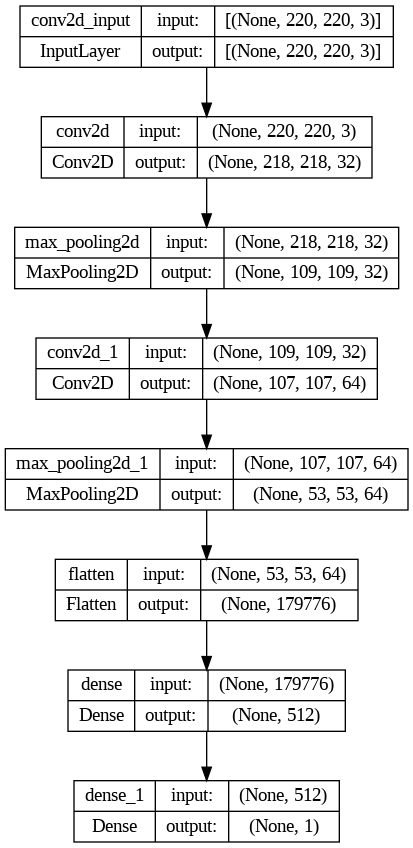

In [34]:
 # Plot Layers
tf.keras.utils.plot_model(modelAug, show_shapes=True)

Model arsitektur yang saya buat, terdiri dari beberapa layer. Layer pertama merupakan layer input dan convolutional. Layer dengan 32 filter berukuran 3x3 ini menggunakan activation function ReLU untuk menangani non linearitas dan mencegah masalah vanishing gradient. Inisialisasi bobot menggunakan distribusi He yang cocok dengan activation function ReLU. Bentuk input pada layer ini adalah gambar dengan dimensi tinggi 220pixel dan lebar 220pixel dengan 3 channel warna yaitu Red, Green dan Blue. Output pada layer ini selanjutnya akan diproses di layer kedua.

Layer kedua dari model ini merupakan layer untuk mengurangi dimensi feature menjadi lebih kecil dengan tetap mempertahankan informasi penting dari gambar. Layer ini meggunakan MaxPooling karena tujuan dari model ini adalah agar fokus pada fitur dominan (mobil dan motor). Output dari layer ini selanjutnya akan diproses pada layer ketiga.

Layer ketiga merupakan layer convolutional kedua, sama seperti layer convolutional pertama namun menggunakan 64 filter untuk menangkap lebih banyak feature dari gambar yang telah melalui proses layer kedua. Layer ini menggunakan inisialisasi bobot berdasarkan distribusi He yang cocok dengan activation function ReLU. Output dari layer ini selanjutnya diproses pada layer keempat.

Layer keempat merupakan layer untuk mengurangi dimensi feature menjadi lebih kecil sama dengan layer kedua namun layer ini menggunakan output dari layer ketiga. Output dari layer ini selanjutnya diproses pada layer kelima.

Layer kelima merupakan flatten layer yang bertujuan untuk mengubah output dari layer keempat menjadi vektor 1 dimensi agar dapat diteruskan ke layer dense (fully connected). Output dari layer ini selanjutnya diproses pada layer keenam.

Layer keenam merupakan layer dense. Layer ini memiliki 512 neuron untuk mengolah dan menangkap pola atau feature yang lebih kompleks dari data. Layer ini menggunakan inisialisasi bobot berdasarkan distribusi He yang cocok dengan activation function ReLu. Output dari layer ini selanjutnya diproses pada layer ketujuh.

Layer ketujuh merupakan layer output, layer ini hanya memiliki 1 neuron karena model memprediksi klasifikasi binary (car atau bike). Fungsi aktivasi layer ini menggunakan sigmoid memberikan output berupa probabilitas antara 0 atau 1. Inisialisasi bobot untuk layer output ini adalah GlorotNormal.

Model kemudian di compile dengan loss function binary crossentropy. Loss function ini berguna untuk menghitung kesalahan antara prediksi model dengan label sebenarnya. Binary crossentropy dipilih karena terdapat 2 kelas target yaitu mobil dan sepeda motor. Optimizer yang digunakan adalah adam untuk mempercepat konvergensi model. Dan penggunaan metriks akurasi untuk mengukur keberhasilan model dalam memprediksi.

## 6.2 - Model Training

Pada bagian ini dilakukan training model menggunakan arsitektur yang telah didefinisikan pada bagian sebelumnya. Model akan dilatih selama 26 epochs untuk memberikan kesempatan bagi model mempelajari pola data. Batch size yang digunakan adalah 64, artinya dalam setiap langkah pelatihan, model memproses 64 gambar secara bersamaan sebelum memperbarui bobotnya.

In [35]:
# Train the model
%%time
histAug = modelAug.fit(trainSetAug, epochs=26, validation_data=valSetAug, batch_size=batchSize)

Epoch 1/26
44/44 [==============================] - 50s 969ms/step - loss: 7.6020 - accuracy: 0.7617 - val_loss: 0.3341 - val_accuracy: 0.8534
Epoch 2/26
44/44 [==============================] - 41s 941ms/step - loss: 0.3030 - accuracy: 0.8800 - val_loss: 0.3614 - val_accuracy: 0.8351
Epoch 3/26
44/44 [==============================] - 41s 938ms/step - loss: 0.3299 - accuracy: 0.8707 - val_loss: 0.2172 - val_accuracy: 0.9293
Epoch 4/26
44/44 [==============================] - 40s 914ms/step - loss: 0.1921 - accuracy: 0.9328 - val_loss: 0.1931 - val_accuracy: 0.9267
Epoch 5/26
44/44 [==============================] - 41s 934ms/step - loss: 0.1643 - accuracy: 0.9385 - val_loss: 0.1803 - val_accuracy: 0.9319
Epoch 6/26
44/44 [==============================] - 41s 930ms/step - loss: 0.1530 - accuracy: 0.9389 - val_loss: 0.1525 - val_accuracy: 0.9450
Epoch 7/26
44/44 [==============================] - 41s 924ms/step - loss: 0.1384 - accuracy: 0.9432 - val_loss: 0.1503 - val_accuracy: 0.9529

## 6.3 - Model Evaluation

Pada bagian ini akan dilakukan evaluasi model. Evaluasi akan dilihat dari grafik performa antara train dan validation serta perbandingan nilai accuracy dari train set dan test set.


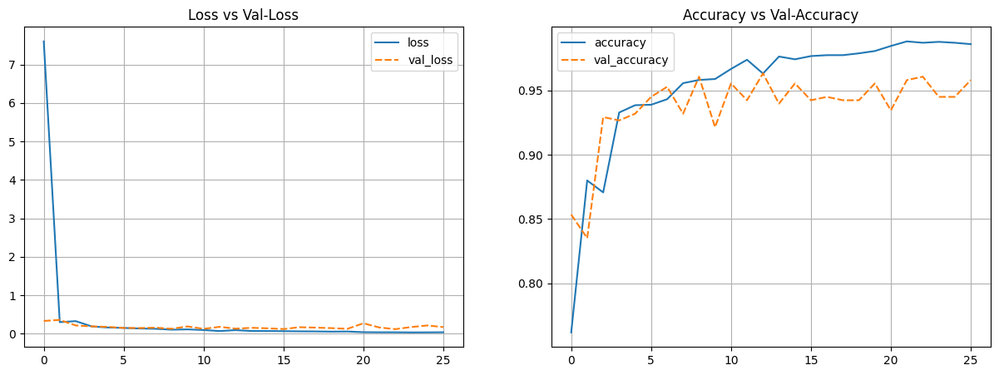

In [36]:
# Plot training results

hist = pd.DataFrame(histAug.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=hist[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

plt.subplot(1, 2, 2)
sns.lineplot(data=hist[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')
plt.show()

Dari grafik loss yang ditampilkan diatas, dapat dilihat bahwa train loss dan validation loss mencapai titik kestabilan di awal dan memiliki gap yang sangat kecil selanjutnya.
Dari segi performansi akurasi, nilai akurasi train dan validation sudah cukup baik dan terlihat memiliki gap yang tidak jauh. Sehingga dari train dan validation set dapat disimpulkan bahwa model sudah goodfit.


In [37]:
# Check the performance of test-set

# Get the probability
yPredProbAug = modelAug.predict(testSetAug)

# Get class with maximum probability
yPredClassAug = np.where(yPredProbAug >= 0.5, 1, 0)

# Display Classification Report
print(classification_report(testSetAug.labels, yPredClassAug))

13/13 [==============================] - 4s 236ms/step
              precision    recall  f1-score   support

           0       0.92      0.95      0.93       397
           1       0.95      0.92      0.93       399

    accuracy                           0.93       796
   macro avg       0.93      0.93      0.93       796
weighted avg       0.93      0.93      0.93       796



Dari hasil accuracy test set diatas, diperoleh informasi bahwa akurasi model sudah cukup baik mencapai 93%. Dibandingkan dengan nilai akurasi train dari epoch ke 26 sebesar 98.61%, selisih akurasi antara train dan test adalah 5.61%. Meskipun perforrma model sudah cukup baik namun, dengan treshold selisih 5%, model agak sedikit overfit. Maka, selanjutnya saya akan mencoba melakukan improvement agar model memiliki performa yang lebih baik.

# 7 - Convolutional Neural Network Improvement

Pada bagian ini akan dilakukan percobaan improvement model dari model yang sebelumnya telah dibuat. Bagian ini berisi model definition, model training dan model evaluation untuk model improvement.

## 7.1 - Model Definition

Bagian ini menjelaskan model arsitektur yang digunakan untuk membangun model improvement. Model improvement dikembangkan menggunakan Sequential API sama dengan sebelumnya. Namun akan ada penambahan beberapa layer agar dapat meningkatkan performa model. Selain itu, bagian ini juga berisi penjelasan struktur neural network yang diimprove layer demi layer.

In [38]:
# Clear session
seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

In [39]:
# Create Sequential API model

modelAugImp = Sequential()
modelAugImp.add(Conv2D(32, (3,3), activation='relu', kernel_initializer = tf.keras.initializers.HeNormal(seed), input_shape=(imgHeight, imgWidth, 3)))
modelAugImp.add(MaxPooling2D(2, 2))

modelAugImp.add(Conv2D(64, (3,3), activation='relu', kernel_initializer = tf.keras.initializers.HeNormal(seed)))
modelAugImp.add(MaxPooling2D(2, 2))

modelAugImp.add(Conv2D(128, (3,3),activation='relu', kernel_initializer = tf.keras.initializers.HeNormal(seed)))
modelAugImp.add(MaxPooling2D(2, 2))

modelAugImp.add(Flatten())
modelAugImp.add(Dense(512, activation='relu', kernel_initializer = tf.keras.initializers.HeNormal(seed)))
modelAugImp.add(Dropout(0.3))
modelAugImp.add(Dense(256, activation='relu', kernel_initializer = tf.keras.initializers.HeNormal(seed)))
modelAugImp.add(Dropout(0.3))
modelAugImp.add(Dense(1, activation='sigmoid', kernel_initializer = tf.keras.initializers.GlorotNormal(seed)))

# Compile
modelAugImp.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])
modelAugImp.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 218, 218, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 109, 109, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 107, 107, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 53, 53, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 51, 51, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 25, 25, 128)       0

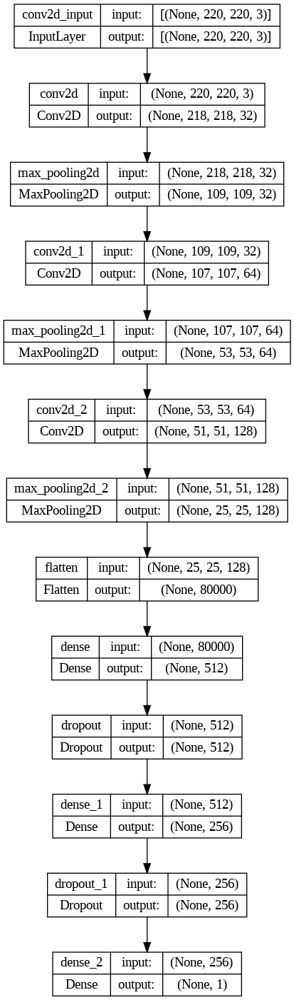

In [40]:
 # Plot Layers
tf.keras.utils.plot_model(modelAugImp, show_shapes=True)

Model imporvement yang dibuat dibangun dengan beberapa layer tambahan yaitu:

1. Penambahan layer convolutional yang menggunakan 128 filter berukuran 3x3 dengan activation function ReLU dan inisialisasi bobot dengan distribusi He.

2. Penambahan layer pooling setelah layer convolutional dengan 128 filter untuk memperkecil dimensi dari output layer convolutional.

3. Penambahan layer dropout setelah layer dense dengan 512 neuron untuk mencegah terjadinya overfitting. Artinya pada saat pelatihan model akan mengabaikan 30% neuron secara acak.

4. Penambahan layer dense dengan 256 neuron untuk menangkap representasi fitur yang lebih baik dari hasil output layer sebelumnya. Layer ini menggunakan activation function ReLU dan inisialisasi bobot dengan distribusi He.

5. Penambahan layer dropout setelah layer dense dengan 256 neuron untuk mencegah overfitting.

Sehingga, model improvement ini terdiri dari 12 layer. Model kemudian di compile dengan loss function, metrics dan optimizer yang sama dengan model yang dibangun sebelumnya.



## 7.2 - Model Training

Pada bagian ini dilakukan training model menggunakan arsitektur improvement yang telah didefinisikan pada bagian sebelumnya. Model akan dilatih selama 26 epochs untuk memberikan kesempatan bagi model mempelajari pola data. Batch size yang digunakan adalah 64 (sama dengan training model sebelumnya), artinya dalam setiap langkah pelatihan, model memproses 64 gambar secara bersamaan sebelum memperbarui bobotnya. Pada training model improvement ini akan dilakukan callbacks early stop agar model dapat secara otomatis menghentikan proses pelatihan jika performa model berhenti membaik setelah beberapa epoch berturut-turut. Pemilihan callbacks early stop ini adalah dengan tujuan agar mencegah overfitting dan menghemat watku pelatihan dengan menghentikan proses lebih awal jika tidak ada peningkatan model dari validasi loss. Hal ini membantu memastikan model memiliki performa baik tanpa pelatihan yang berlebihan.

In [41]:
# Callback
earlyStop = EarlyStopping(monitor='val_loss',
                           patience=3,
                           restore_best_weights=True)

In [42]:
# Train the model
%%time
histAugImp = modelAugImp.fit(trainSetAug, epochs=26, validation_data=valSetAug, batch_size=batchSize, callbacks=[earlyStop])

Epoch 1/26
44/44 [==============================] - 46s 953ms/step - loss: 2.4306 - accuracy: 0.6638 - val_loss: 0.3506 - val_accuracy: 0.8508
Epoch 2/26
44/44 [==============================] - 41s 930ms/step - loss: 0.3166 - accuracy: 0.8660 - val_loss: 0.1879 - val_accuracy: 0.9450
Epoch 3/26
44/44 [==============================] - 41s 930ms/step - loss: 0.2298 - accuracy: 0.9039 - val_loss: 0.2020 - val_accuracy: 0.9241
Epoch 4/26
44/44 [==============================] - 40s 923ms/step - loss: 0.2034 - accuracy: 0.9214 - val_loss: 0.2143 - val_accuracy: 0.9136
Epoch 5/26
44/44 [==============================] - 41s 929ms/step - loss: 0.1679 - accuracy: 0.9321 - val_loss: 0.1575 - val_accuracy: 0.9476
Epoch 6/26
44/44 [==============================] - 42s 937ms/step - loss: 0.1741 - accuracy: 0.9278 - val_loss: 0.1529 - val_accuracy: 0.9293
Epoch 7/26
44/44 [==============================] - 41s 924ms/step - loss: 0.1440 - accuracy: 0.9457 - val_loss: 0.1308 - val_accuracy: 0.9555

Dari hasil pelatihan diatas, model berhenti pada epoch ke 12 dan runtimenya lebih singkat (sekitar 8 menit). Artinya model cukup baik dengan hanya berlatih selama 12 epoch dan membutuhkan waktu yang lebih singkat dari sebelum improvement. Selanjutnya akan dilakukan evaluasi model lebih detail.

## 7.3 - Model Evaluation

Pada bagian ini akan dilakukan evaluasi model. Evaluasi akan dilihat dari grafik performa antara train dan validation serta perbandingan nilai accuracy dari train set dan test set.


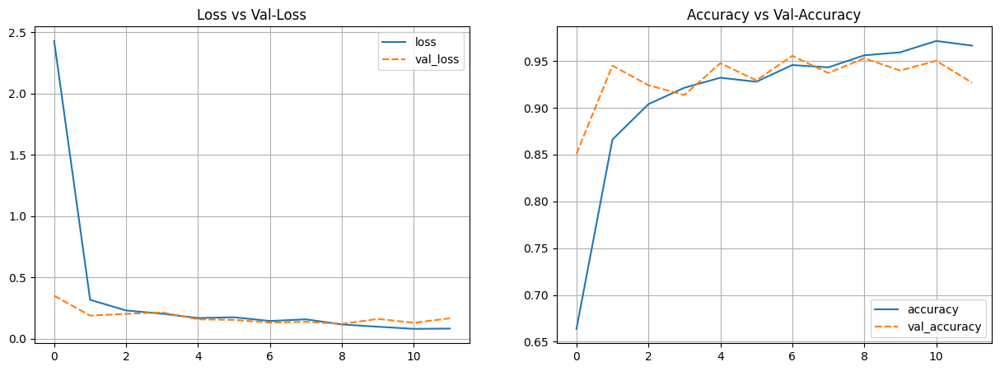

In [43]:
# Plot training results

hist = pd.DataFrame(histAugImp.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=hist[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

plt.subplot(1, 2, 2)
sns.lineplot(data=hist[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')
plt.show()

Dari grafik loss yang ditampilkan diatas, dapat dilihat bahwa train loss dan validation loss mencapai titik kestabilan di awal dan memiliki gap yang sangat kecil selanjutnya.
Dari segi performansi akurasi, nilai akurasi train dan validation sudah cukup baik dan terlihat memiliki gap yang tidak jauh bahkan lebih kecil dari model sebelum improvement. Sehingga dari train dan validation set dapat disimpulkan bahwa model sudah goodfit.


In [44]:
# Check the performance of test-set

# Get the probability
yPredProbAug2 = modelAugImp.predict(testSetAug)

# Get class with maximum probability
yPredClassAug2 = np.where(yPredProbAug2 >= 0.5, 1, 0)

# Display Classification Report
print(classification_report(testSetAug.labels, yPredClassAug2))

13/13 [==============================] - 3s 207ms/step
              precision    recall  f1-score   support

           0       0.90      0.95      0.93       397
           1       0.95      0.90      0.92       399

    accuracy                           0.93       796
   macro avg       0.93      0.93      0.93       796
weighted avg       0.93      0.93      0.93       796



Dari hasil accuracy test set diatas, diperoleh informasi bahwa akurasi model sudah cukup baik yaitu 93%. Dibandingkan dengan akurasi pada train set sebesar 96.64%. Artinya model setelah improvement tidak overfit dengan selisih nilai accuracy sebesar 3.64%.

Model setelah improvement memiliki akurasi yang kurang lebih sama dengan sebelum improvement (di atas 90%). Namun, model setelah improvement dapat dikatakan lebih baik daripada model sebelum improvement karena cenderung lebih tidak overfit. Sekain itu, model setelah improvement memiliki jumlah epoch yang lebih sedikit, waktu training yang lebih singkat, dan ukuran model yang lebih kecil.

Model sebelum improvement memiliki  92.065.729 (351.20 MB) trainable params, dan model setelah improvement memiliki 41.185.345 (157.11 MB) trainable params.

Model setelah improvement akan dipilih untuk prediksi data inference dan model deployment.

# 8 - Strengths and Limitations

Pada bagian ini akan dianalisa kelebihan dan kekurangan dari model yang sudah diimprove performanya. Saya akan menggabungkan file asli dengan hasil prediksi dari test untuk melihat pola kesalahan yang dilakukan oleh model.

In [45]:
# Test label and file name
testLabel = testSetAug.labels
testFileNames = testSetAug.filenames

In [46]:
# Concat file true label and predicted label
testDF = pd.DataFrame ({
    'fileName': testFileNames,
    'trueLabel': testLabel,
    'predProb': yPredProbAug2.flatten(),
    'predLabel': yPredClassAug2.flatten()})
testDF.head(10)

,fileName,trueLabel,predProb,predLabel
0,/content/Car-Bike-Dataset/Car/car_00011.jpeg,1,0.984037,1
1,/content/Car-Bike-Dataset/Bike/bike_01475.jpeg,0,0.004627,0
2,/content/Car-Bike-Dataset/Car/car_01654.jpeg,1,0.999991,1
3,/content/Car-Bike-Dataset/Car/car_00028.jpeg,1,0.999999,1
4,/content/Car-Bike-Dataset/Car/car_01451.jpeg,1,1.000000,1
5,/content/Car-Bike-Dataset/Bike/bike_01344.jpeg,0,0.000754,0
6,/content/Car-Bike-Dataset/Car/car_01893.jpeg,1,0.999999,1
7,/content/Car-Bike-Dataset/Bike/bike_01493.jpeg,0,0.001109,0
8,/content/Car-Bike-Dataset/Bike/bike_00340.jpeg,0,0.682761,1
9,/content/Car-Bike-Dataset/Car/car_01414.jpeg,1,0.999995,1


Berikut ini adalah gambar yang diprediksi dengan tepat oleh model.

In [47]:
# Groupping the images predicted true
true = testDF.query("trueLabel == predLabel")
true.head(10)

,fileName,trueLabel,predProb,predLabel
0,/content/Car-Bike-Dataset/Car/car_00011.jpeg,1,0.984037,1
1,/content/Car-Bike-Dataset/Bike/bike_01475.jpeg,0,0.004627,0
2,/content/Car-Bike-Dataset/Car/car_01654.jpeg,1,0.999991,1
3,/content/Car-Bike-Dataset/Car/car_00028.jpeg,1,0.999999,1
4,/content/Car-Bike-Dataset/Car/car_01451.jpeg,1,1.000000,1
5,/content/Car-Bike-Dataset/Bike/bike_01344.jpeg,0,0.000754,0
6,/content/Car-Bike-Dataset/Car/car_01893.jpeg,1,0.999999,1
7,/content/Car-Bike-Dataset/Bike/bike_01493.jpeg,0,0.001109,0
9,/content/Car-Bike-Dataset/Car/car_01414.jpeg,1,0.999995,1
10,/content/Car-Bike-Dataset/Car/car_01018.jpeg,1,0.999995,1


In [48]:
# Function to show image
def showImages(df, startInd, endInd):
    index_list = list(range(startInd, endInd + 1))
    fig, axes = plt.subplots(1, len(index_list), figsize=(15, 10))
    if len(index_list) == 1:
        axes = [axes]
    for i, idx in enumerate(index_list):
        img = tf.keras.utils.load_img(df.iloc[idx]['fileName'], target_size=(220, 220))
        axes[i].imshow(img)
        axes[i].axis('off')
        axes[i].set_title(f"True: {df.iloc[idx]['trueLabel']}, Pred: {df.iloc[idx]['predLabel']}")

    plt.tight_layout()
    plt.show()

In [49]:
# Count length of true
print("Length true:",len(true))

Length true: 737


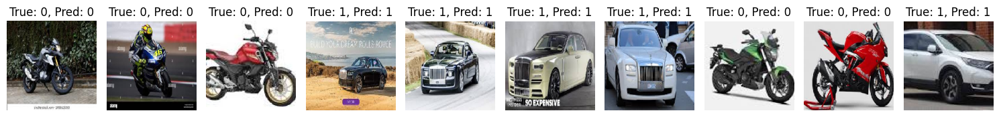

In [50]:
# Display image where predicted true
showImages(true, startInd=10, endInd=19)

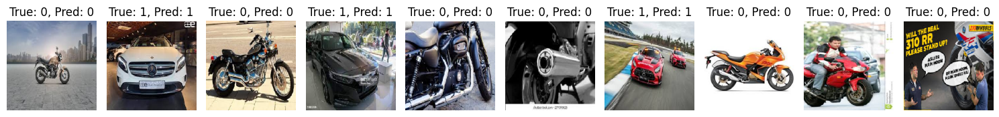

In [51]:
# Display image where predicted true
showImages(true, startInd=200, endInd=209)

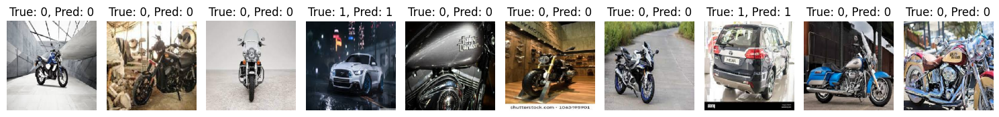

In [52]:
# Display image where predicted true
showImages(true, startInd=100, endInd=109)

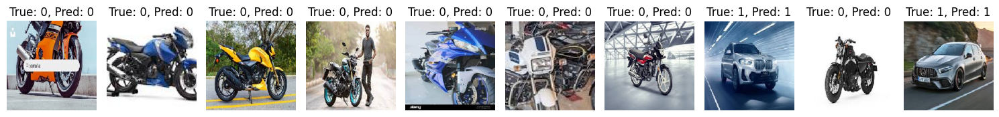

In [53]:
# Display image where predicted true
showImages(true, startInd=150, endInd=159)

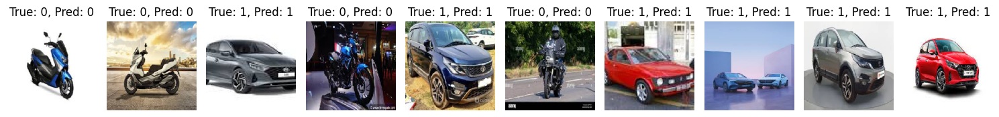

In [54]:
# Display image where predicted true
showImages(true, startInd=30, endInd=39)

Dari visualisasi diatas, dapat dilihat bahwa model sudah cukup baik dalam mengenali object sepeda motor dan mobil.
- Model dapat mengenali sepeda motor dengan tipe skuter yang merupakan tipe sepeda motor yang sepertinya tidak terlihat dominan pada saat proses EDA.
- Model dapat mengenali bentuk object yang juga mengandung object manusia dalam gambar.
- Model dapat mengenali object mobil atau sepeda motor yang dalam 1 gambar terdapat lebih dari 1 mobil.
- Model dapat mengenali sepeda motor yang sedang dikendarai.
- Model dapat mengenali mobil dan sepeda motor dengan berbagai macam background.
- Model dapat mengenali sepeda motor walaupun hanya bagian logo sepeda motor atau knalpot yang ditampilkan.

Selanjutnya, akan saya analisa kelemahan dari model.

In [55]:
# Groupping the images predicted false
false = testDF.query("trueLabel != predLabel")
false.head(10)

,fileName,trueLabel,predProb,predLabel
8,/content/Car-Bike-Dataset/Bike/bike_00340.jpeg,0,0.682761,1
17,/content/Car-Bike-Dataset/Bike/bike_01441.jpeg,0,0.656413,1
33,/content/Car-Bike-Dataset/Car/car_00129.jpeg,1,0.479375,0
44,/content/Car-Bike-Dataset/Car/car_01243.jpeg,1,0.017007,0
52,/content/Car-Bike-Dataset/Car/car_00610.jpeg,1,0.358578,0
59,/content/Car-Bike-Dataset/Car/car_01217.jpeg,1,0.471747,0
77,/content/Car-Bike-Dataset/Car/car_01520.jpeg,1,0.202433,0
85,/content/Car-Bike-Dataset/Car/car_01368.jpeg,1,0.317595,0
89,/content/Car-Bike-Dataset/Car/car_00646.jpeg,1,0.301558,0
101,/content/Car-Bike-Dataset/Car/car_01866.jpeg,1,0.056055,0


In [56]:
# Count length of false
print("Length false:",len(false))

Length false: 59


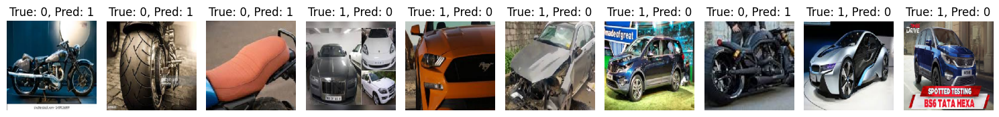

In [57]:
# Display image where predicted false
showImages(false, startInd=10, endInd=19)

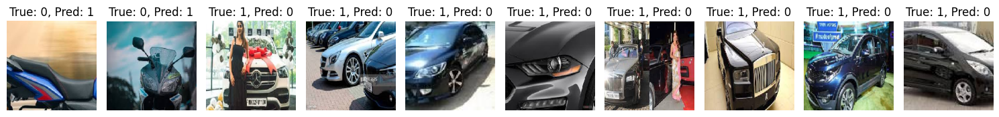

In [58]:
# Display image where predicted false
showImages(false, startInd=0, endInd=9)

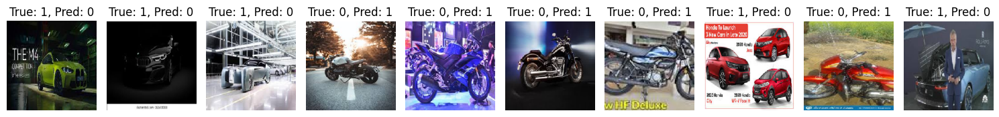

In [59]:
# Display image where predicted false
showImages(false, startInd=20, endInd=29)

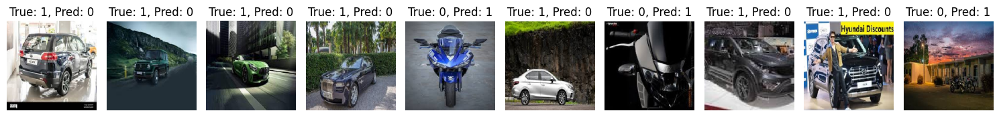

In [60]:
# Display image where predicted false
showImages(false, startInd=30, endInd=39)

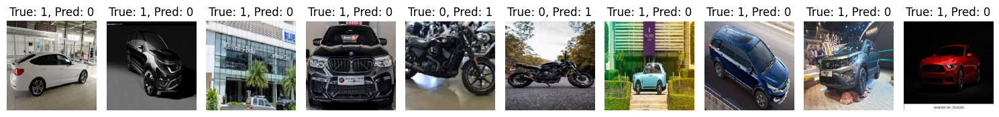

In [61]:
# Display image where predicted false
showImages(false, startInd=40, endInd=49)

Dari visualisasi diatas, dapat dilihat bahwa model gagal mengenali gambar dengan ciri-ciri sebagai berikut:
- Gambar yang warna objectnya cenderung mirip dengan warna backgroundnya.
- Gambar dengan sudut pengambilan gambar yang terlalu jauh.
- Gambar dengan object yang terpotong (hanya bagian tempat duduk motor saja atau lampu mobil saja).
- Gambar mobil yang bentuknya hancur atau tidak utuh (seperti setelah mengalami kecelakaan).
- Gambar dengan object yang terhalang oleh manusia.


Sehingga, dari hasil analisa kelebihan dan kekurangan model ini, dapat diberikan langkah-langkah perbaikan model sebagai berikut:

- Mencoba meningkatkan teknik augmentasi zoom untuk gambar yang diambil dari angle jauh.
- Memastikan data memiliki kualitas konsisten dan mencakup berbagai macam kondisi termasuk mobil rusak atau gambar object yang warnanya mirip dengan background gambar.
- Menggunakan pretrained models (transfer learning).

Dengan perbaikan tersebut diharapkan model dapat meberikan hasil yang lebih baik.


# 9 - Model Saving

Pada bagian ini dilakukan model saving untuk digunakan memprediksi data inference dan dilakukan deployment.

In [62]:
# Freeze model
modelAugImp.trainable = False
modelAugImp.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 218, 218, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 109, 109, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 107, 107, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 53, 53, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 51, 51, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 25, 25, 128)       0

In [63]:
# Save model
modelAugImp.save('modelPred.keras')

# 10 - Model Inference & Deployment

Pada bagian ini model digunakan untuk prediksi data inference (data baru). Pengerjaannya dilakukan di notebook berbeda dengan nama notebook P2G7_verrenmonica_inf.ipynb.

URL deployment: [Car vs Bike Prediction](https://huggingface.co/spaces/verrenmo/hacktiv8-computervision-project)

# 11 - Conclusion

Dari hasil EDA yang dilakukan, diperoleh informasi bahwa:
- Dataset bike yang dimiliki dominan dengan tipe sepeda motor selain skuter dan motor bebek sedangkan untuk dataset car sudah cukup mewakili berbagai macam tipe dan bentuk mobil kecuali tipe pickup truck.
- Dari sudut pengambilan gambar mobil dan motor sudah cukup variatif namun ada yang terlalu jauh sehingga dapat membuat model kesulitan mengenali object.
- Dari warna object juga sudah cukup variatif agar model dapat mengenali berbagai macam warna object.
- Dari segi background gambar juga sudah sangat variatif dan dapat membantu model belajar mengenali object dengan berbagai macam background.
- Ukuran gambar dalam dataset sangat beragam sehingga perlu dilakukan resizing pada saat preprocessing data.
- Gambar dalam dataset memiliki 3 jenis color modes sehingga perlu diseragamkan dengan membersihkan dataset dari gambar yang memiliki color modes lain selain RGB.

Dari hasil modeling sebelum improvement, model dapat dikatakan agak sedikit overfit. Sehingga dilakukan improvement model dengan menambah beberapa layer seperti layer convolutional, layer pooling, layer dropout dan layer dense. Hasilnya, model setelah improvement lebih goodfit dengan jumlah epoch yang lebih sedikit dan waktu training yang lebih singkat. Selain itu, model setelah improvement juga memiliki ukuran trainable params yang lebih sedikit dibandingkan sebelum improvement.

Sehingga model setelah improvement dipilih untuk memprediksi inference data dan dilakukan deployment.

Kelebihan model setelah improvement adalah:
- Model dapat mengenali sepeda motor dengan tipe skuter yang merupakan tipe sepeda motor yang sepertinya tidak terlihat dominan pada saat proses EDA.
- Model dapat mengenali bentuk object yang juga mengandung object manusia dalam gambar.
- Model dapat mengenali object mobil atau sepeda motor yang dalam 1 gambar terdapat lebih dari 1 mobil.
- Model dapat mengenali sepeda motor yang sedang dikendarai.
- Model dapat mengenali mobil dan sepeda motor dengan berbagai macam background.
- Model dapat mengenali sepeda motor walaupun hanya bagian logo sepeda motor yang ditampilkan.

Sedangkan kekurangan model adalah model kurang mampu mengenali gambar dengan karakteristik berikut:
- Gambar yang warna objectnya cenderung mirip dengan warna backgroundnya.
- Gambar dengan sudut pengambilan gambar yang terlalu jauh.
- Gambar dengan object yang terpotong (hanya bagian tempat duduk motor saja atau lampu mobil saja).
- Gambar mobil yang bentuknya hancur atau tidak utuh (seperti setelah mengalami kecelakaan).
- Gambar dengan object yang terhalang oleh manusia.

Sehingga, dari hasil analisa kelebihan dan kekurangan model ini, dapat diberikan langkah-langkah perbaikan model sebagai berikut:

- Mencoba meningkatkan teknik augmentasi zoom untuk gambar yang diambil dari angle jauh.
- Memastikan data memiliki kualitas konsisten dan mencakup berbagai macam kondisi termasuk mobil rusak atau gambar object yang warnanya mirip dengan backgrround gambar
- Menggunakan pretrained models (transfer learning).

Dengan perbaikan tersebut diharapkan model dapat meberikan hasil yang lebih baik.

Dari hasil prediksi inference, model dapat mengenali 1 gambar mobil dan 1 gambar sepeda motor dengan benar.
